In [2]:
import jax
import joblib
import jax.numpy as jnp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from tqdm.auto import tqdm
from itertools import product
from toolz import pluck, valmap, keyfilter, compose
from aging.behavior.bio_age_model import fit_model, masked_xval
from aging.plotting import (
    figure,
    format_plots,
    add_identity,
    legend,
    PlotConfig,
    save_factory,
)
from sklearn.preprocessing import OneHotEncoder

In [3]:
format_plots()

In [4]:
c = PlotConfig()
saver = save_factory(c.save_path / "bio_age_model", tight_layout=False)

In [5]:
def zscore(ser: pd.Series):
    return (ser - ser.mean()) / ser.std()


def demean(ser: pd.Series):
    return ser - ser.mean()

# Ontogeny

In [50]:
df = pd.read_parquet(
    "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_relabeled_counts_matrix_v00.parquet"
)
df = df.sort_index(axis=1)

n_syllables = 70
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))[:, :n_syllables]

pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_mouse_area_df_v00.parquet'
size_df = pd.read_parquet(pth)

sizes_col = zscore(size_df.groupby('age')['quant_0.5'].transform(demean))
# sizes_col = size_df.groupby('age')['quant_0.5'].transform(zscore)
# sizes_col = size_df['quant_0.5']
sizes_col = sizes_col.loc[df.index]

In [57]:
features = {
    "ages": age,
    "counts": syllable_counts_jax + 1,
    "sizes": sizes_col.to_numpy(),
}

hypparams = {
    "min_age": 1,
    "max_age": 115,
    "age_sd": 26,  # weeks
    "bio_params_sd": 0.3,
    "size_params_sd": 0.3,
    "n_age_samples": 1000,
    "n_splines": 5,
    "n_size_splines": 5,
    "n_syllables": n_syllables,
    "n_keep_sylls": 30,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 150,
}

## Run gridsearch

On:
- n_splines
- age_sd
- n_heldout_sylls

In [52]:
save_path = Path('/n/scratch/users/w/wg41/bio-age-model')
save_path.mkdir(exist_ok=True)

In [58]:
mdl_v1 = masked_xval(features, hypparams, 1, n_repeats=10)

In [59]:
mdl_v2 = masked_xval(features, hypparams, 2, n_repeats=10)

In [60]:
print("Model v1", np.mean(list(pluck("heldout_r2_total", mdl_v1.values()))))
print("Model v2", np.mean(list(pluck("heldout_r2_total", mdl_v2.values()))))

Model v1 0.4683546381349782
Model v2 0.4760820910679497


In [63]:
print("Model v1", np.mean(list(pluck("heldout_r2_total_v2", mdl_v1.values()))))
print("Model v2", np.mean(list(pluck("heldout_r2_total_v2", mdl_v2.values()))))

Model v1 0.4509964016042961
Model v2 0.4585366070497165


In [61]:
print("Model v1", np.mean(list(pluck("heldout_ll", mdl_v1.values()))))
print("Model v2", np.mean(list(pluck("heldout_ll", mdl_v2.values()))))

Model v1 -415418.5
Model v2 -415283.1


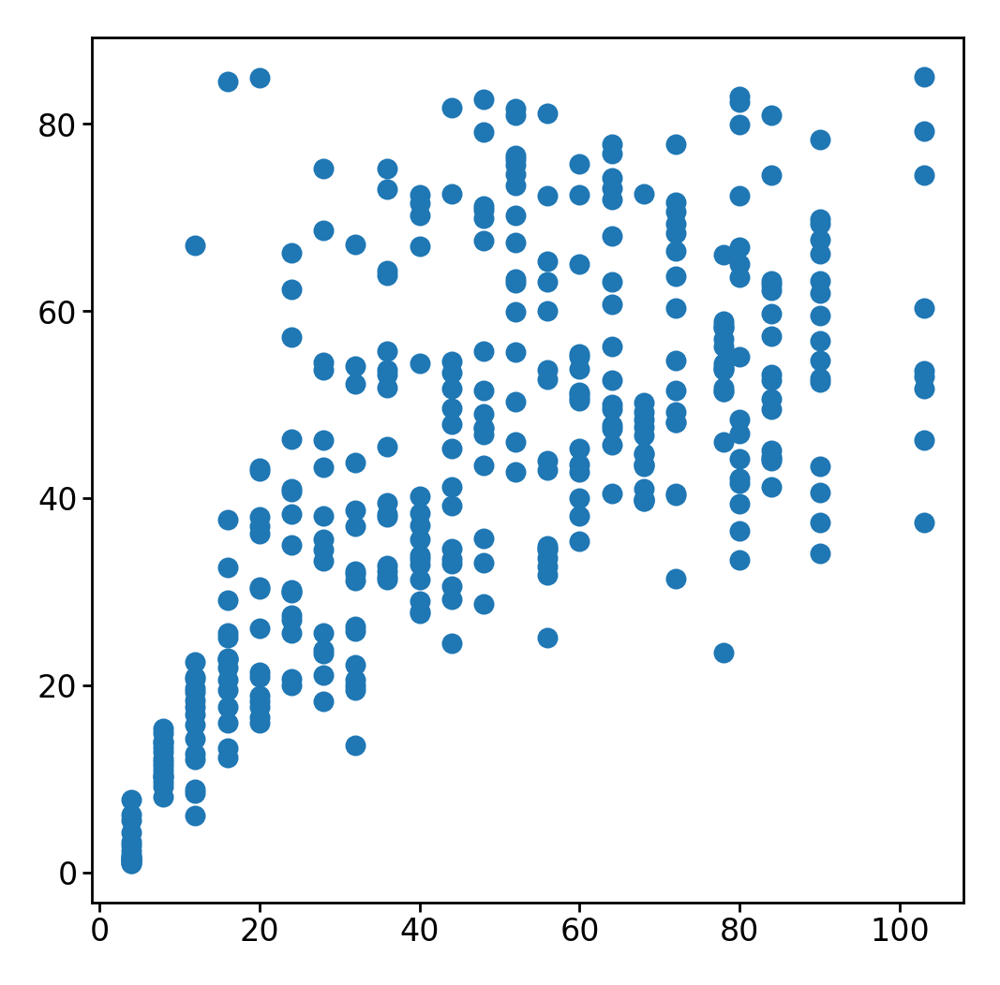

In [62]:
avg = np.mean(list(pluck("bio_ages", mdl_v2.values())), axis=0)
plt.scatter(mdl_v2[0]['true_ages'], avg, s=10)

## Optimize number of syllables to run on

In [11]:
outs = {}

for n_keep in tqdm(range(20, n_syllables - 5, 5)):
    hypparams["n_keep_sylls"] = n_keep
    outs[n_keep] = masked_xval(features, hypparams, 1, n_repeats=5)

heldout_r2 = valmap(lambda v: list(pluck("heldout_r2_total", v.values())), outs)
heldout_r2 = pd.DataFrame(heldout_r2)

heldout_r2_v2 = valmap(lambda v: list(pluck("heldout_r2_total_v2", v.values())), outs)
heldout_r2_v2 = pd.DataFrame(heldout_r2_v2)

heldout_ll = valmap(lambda v: list(pluck("heldout_ll", v.values())), outs)
heldout_ll = pd.DataFrame(heldout_ll)
heldout_ll.mean().sort_values(ascending=False)

  0%|          | 0/9 [00:00<?, ?it/s]

60   -370490.2
55   -377833.2
50   -385198.2
45   -392623.4
40   -400122.2
35   -407664.8
30   -415358.0
25   -423275.2
20   -431477.6
dtype: float64

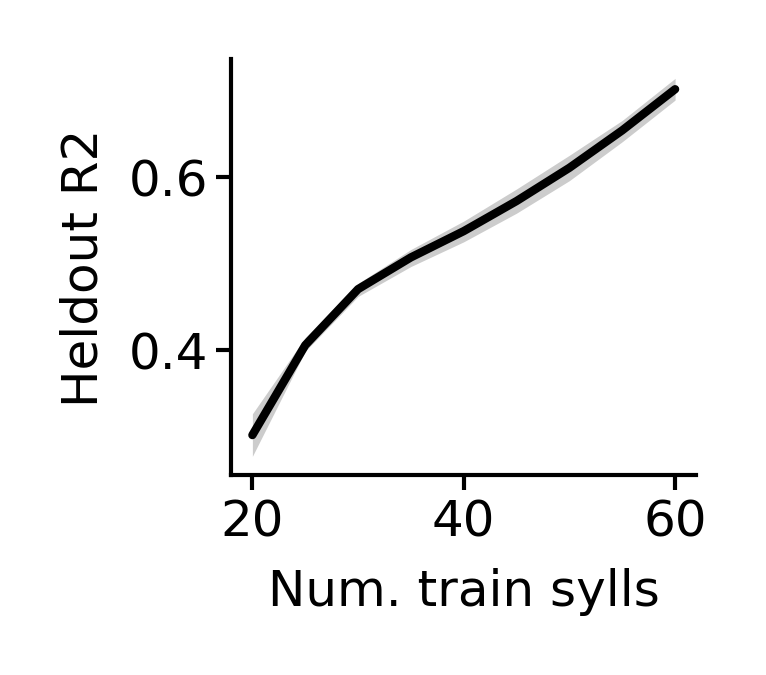

In [12]:
fig = figure(1, 0.9)
ax = sns.lineplot(
    data=heldout_r2.melt(),
    x="variable",
    y="value",
    errorbar=("ci", 95),
    color="k",
    err_kws={"lw": 0},
)
ax.set(xlabel="Num. train sylls", ylabel="Heldout R2")
# ax.axvline(5, color='silver', ls='--', zorder=-1)
sns.despine()
# saver(fig, "n-keep-sylls-heldout-r2");

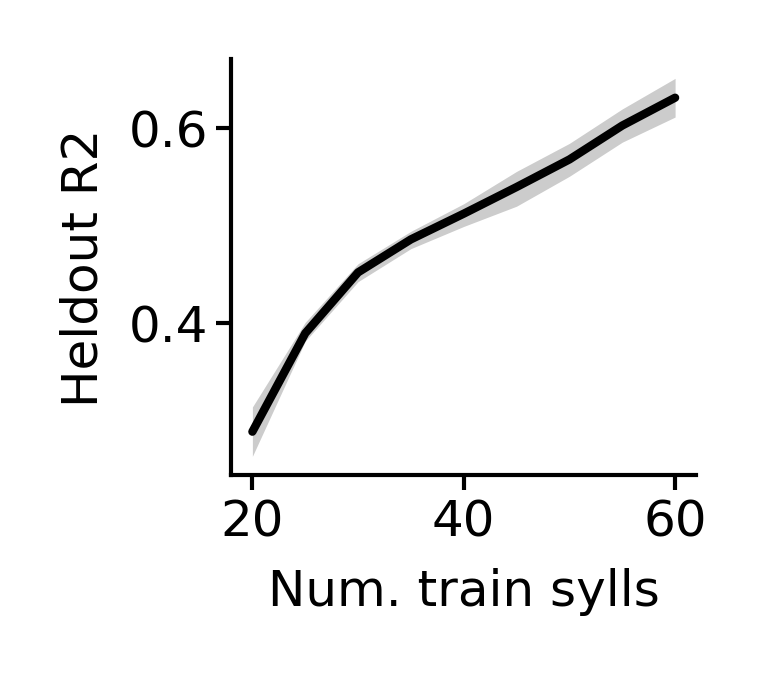

In [13]:
fig = figure(1, 0.9)
ax = sns.lineplot(
    data=heldout_r2_v2.melt(),
    x="variable",
    y="value",
    errorbar=("ci", 95),
    color="k",
    err_kws={"lw": 0},
)
ax.set(xlabel="Num. train sylls", ylabel="Heldout R2")
# ax.axvline(5, color='silver', ls='--', zorder=-1)
sns.despine()
# saver(fig, "n-keep-sylls-heldout-r2");

## Gridsearch n_splines and age_sd

In [9]:
# do the optimal values change depending on the number of heldout syllables?

outs = []

n_flush_samples = 10

for i, (age_sd, n_splines) in tqdm(
    list(enumerate(product(range(10, 33, 3), range(5, 11, 1))))
):
    hypparams["age_sd"] = age_sd
    hypparams["n_splines"] = n_splines

    tmp = masked_xval(features, hypparams, 1, n_repeats=8)

    for v in tmp.values():
        v["init_components"].age_normalizer = None
        v["init_components"].age_unnormalizer = None

    tmp["grid_params"] = {
        "age_sd": age_sd,
        "n_splines": n_splines,
    }
    # each output is HUGE so need to filter to save only what I care about
    outs.append(tmp)
    if (i + 1) % n_flush_samples == 0:
        joblib.dump(
            outs, save_path / f"model_v1_gridsearch_file-{i // n_flush_samples:02d}.p"
        )
        outs = []
joblib.dump(
    outs, save_path / f"model_v1_gridsearch_file-{(i + n_flush_samples) // n_flush_samples:02d}.p"
)
outs = []

  0%|          | 0/48 [00:00<?, ?it/s]

## Add size, run parameter scan

In [9]:
# do the optimal values change depending on the number of heldout syllables?

outs = []

n_flush_samples = 10

for i, (age_sd, n_splines) in tqdm(
    list(enumerate(product(range(10, 33, 3), range(5, 11, 1))))
):
    hypparams["age_sd"] = age_sd
    hypparams["n_splines"] = n_splines

    tmp = masked_xval(features, hypparams, 2, n_repeats=8)

    for v in tmp.values():
        v["init_components"].age_normalizer = None
        v["init_components"].age_unnormalizer = None

    tmp["grid_params"] = {
        "age_sd": age_sd,
        "n_splines": n_splines,
    }
    # each output is HUGE so need to filter to save only what I care about
    outs.append(tmp)
    if (i + 1) % n_flush_samples == 0:
        joblib.dump(
            outs, save_path / f"model_v2_gridsearch_file-{i // n_flush_samples:02d}.p"
        )
        outs = []
joblib.dump(
    outs, save_path / f"model_v2_gridsearch_file-{(i + n_flush_samples) // n_flush_samples:02d}.p"
)
outs = []

  0%|          | 0/48 [00:00<?, ?it/s]

#### Test new model type

In [8]:
hypparams["age_sd"] = 25
hypparams["n_splines"] = 5
hypparams["n_size_splines"] = 5

out = masked_xval(features, hypparams, 2, n_repeats=1)

In [9]:
list(out[0])

['params',
 'heldout_ll',
 'loss',
 'bio_ages',
 'true_ages',
 'init_components',
 'concentrations',
 'concentration_components',
 'predicted_counts',
 'counts',
 'r2_total',
 'r2_each',
 'heldout_r2_total_v2',
 'heldout_r2_total']

In [15]:
out[0]['heldout_ll']

-413385

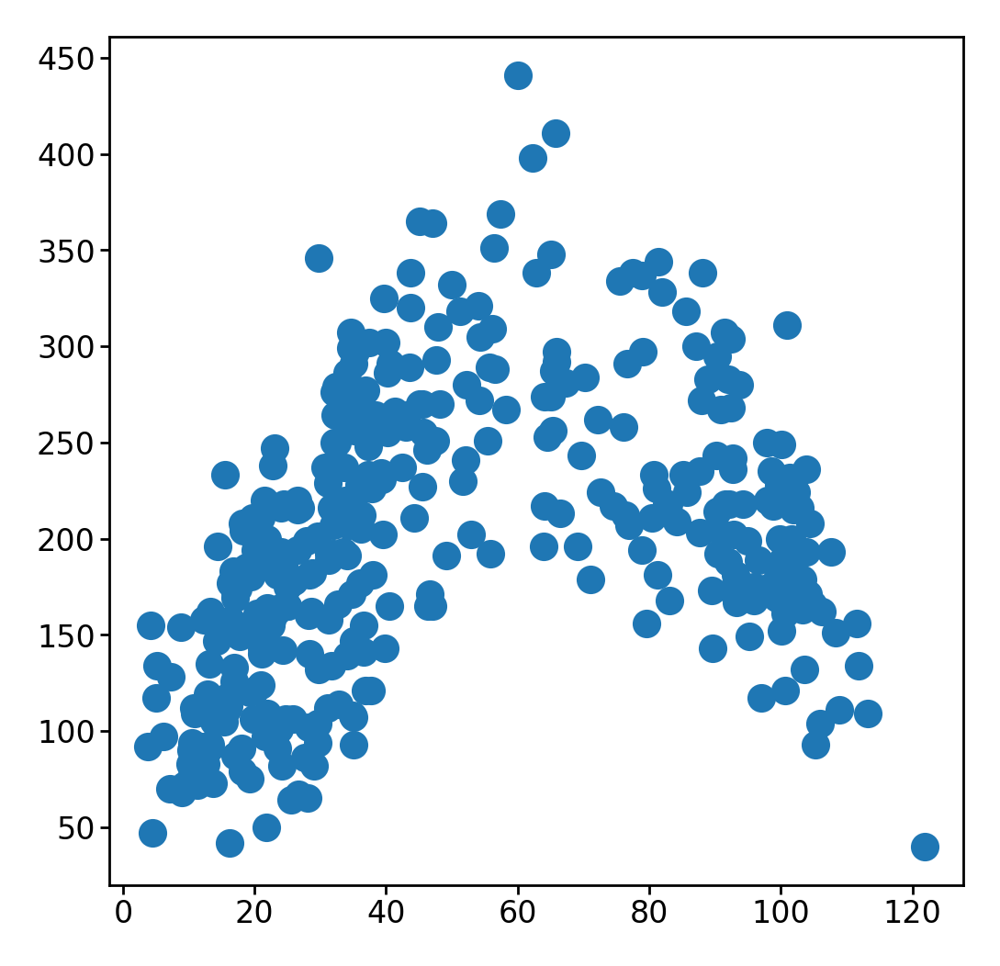

In [10]:
plt.scatter(out[0]['bio_ages'], syllable_counts_jax[:, 0])

<Axes: >

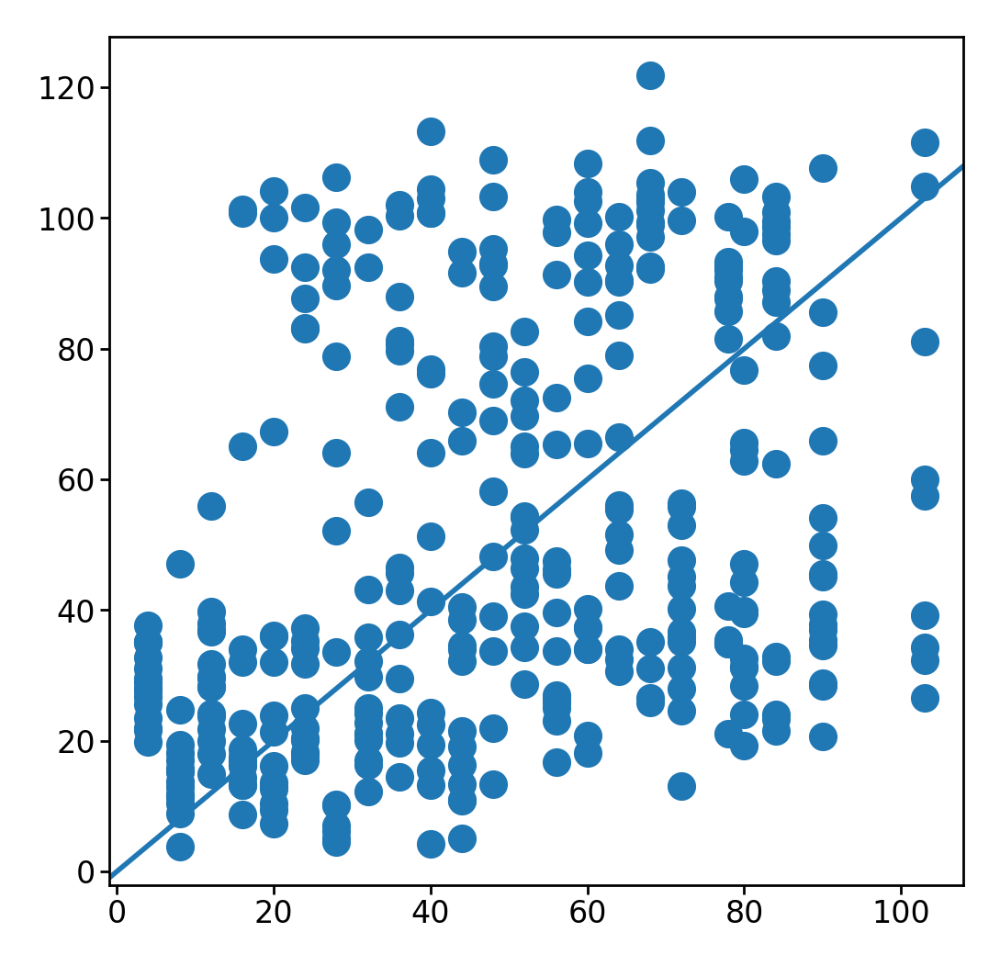

In [11]:
plt.scatter(out[0]['true_ages'], out[0]['bio_ages'])
add_identity(plt.gca())

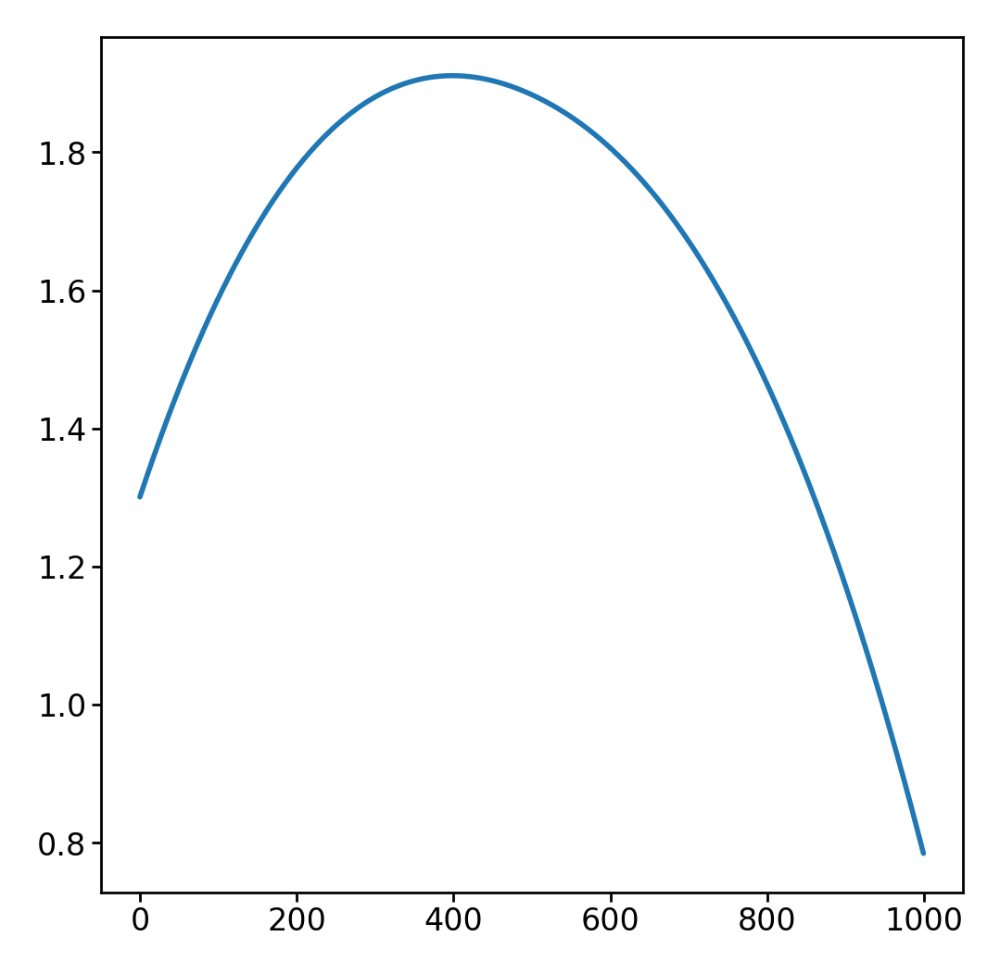

In [12]:
plt.plot(out[0]['concentration_components']['bio'][0])

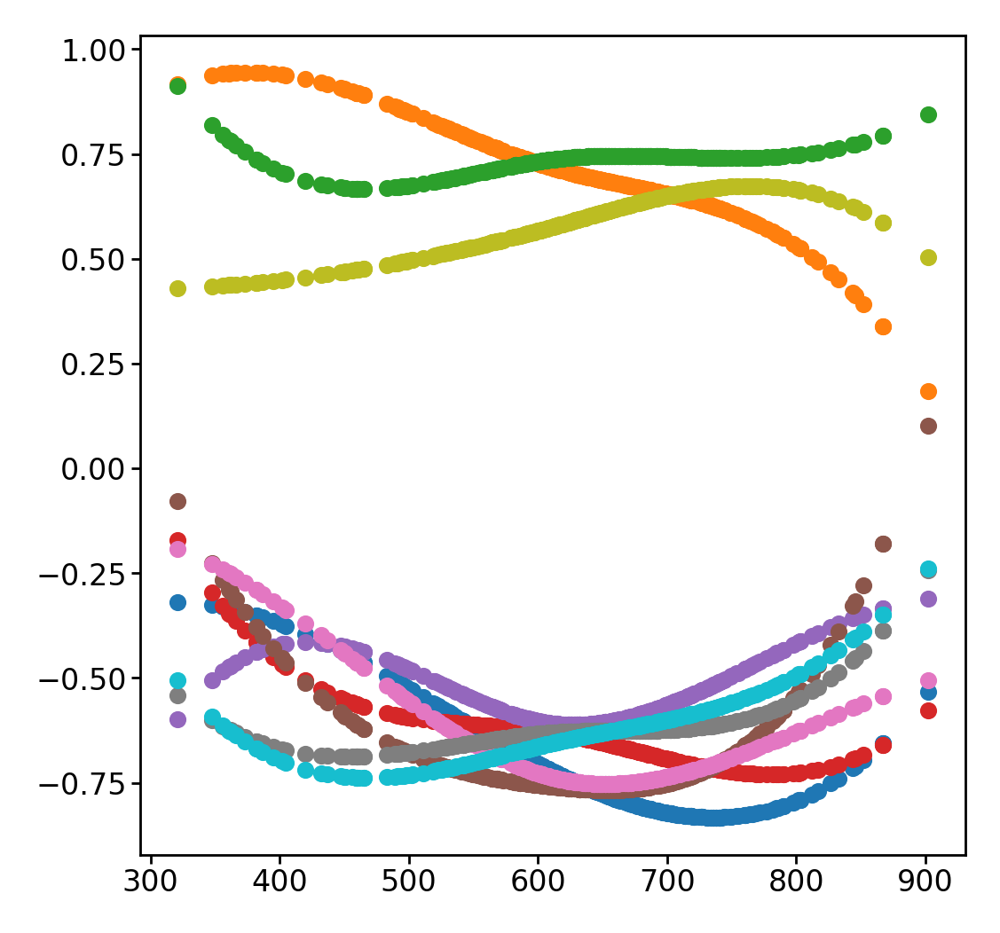

In [13]:
for i in range(10):
    plt.scatter(sizes_col, out[0]['concentration_components']['size'][i], s=7)

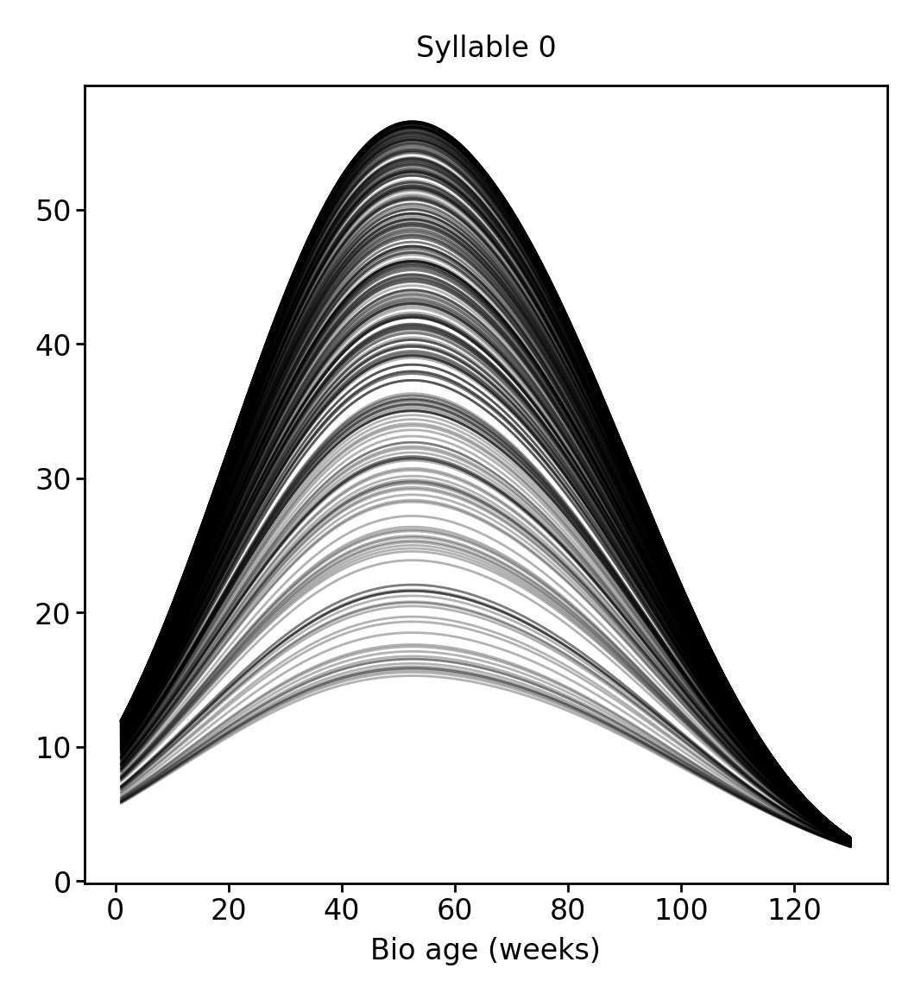

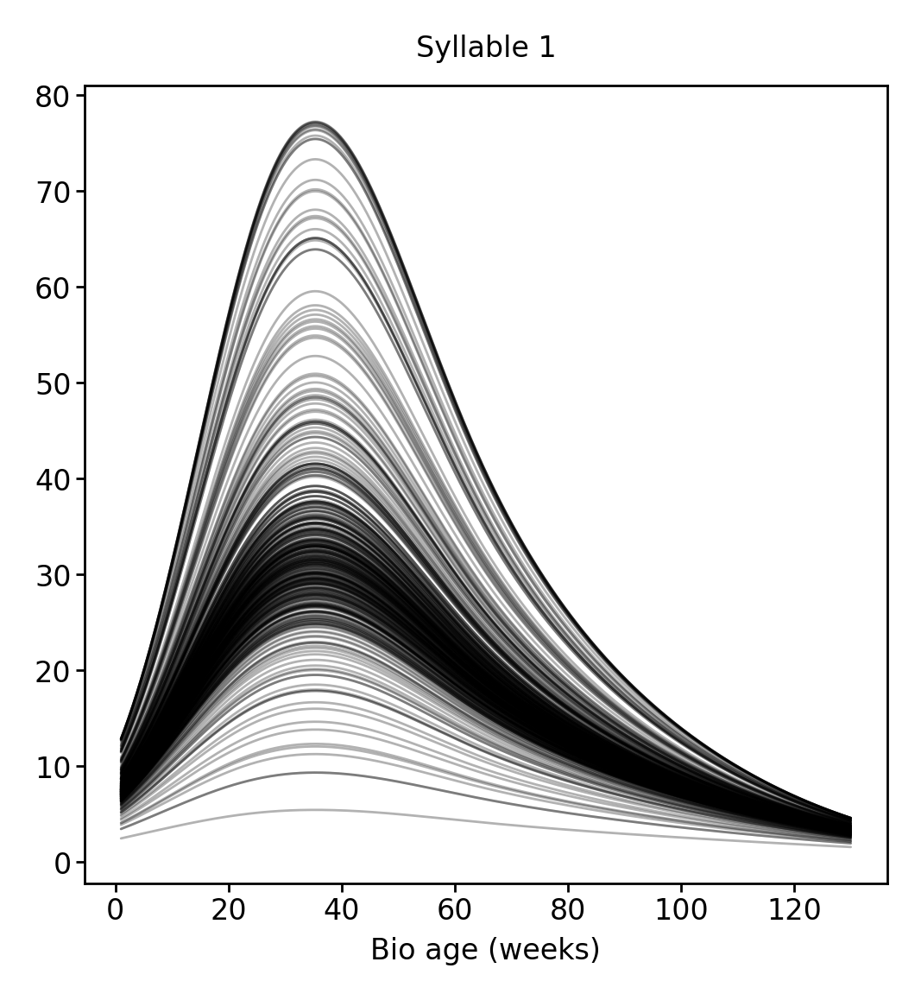

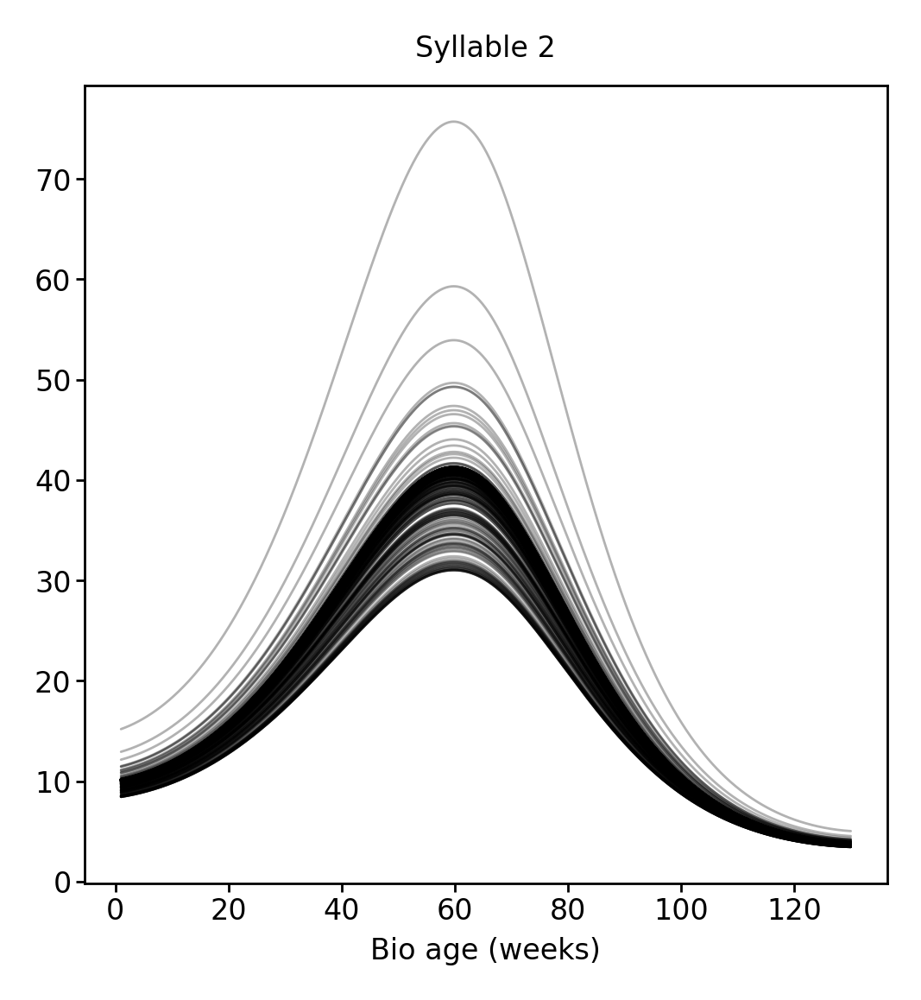

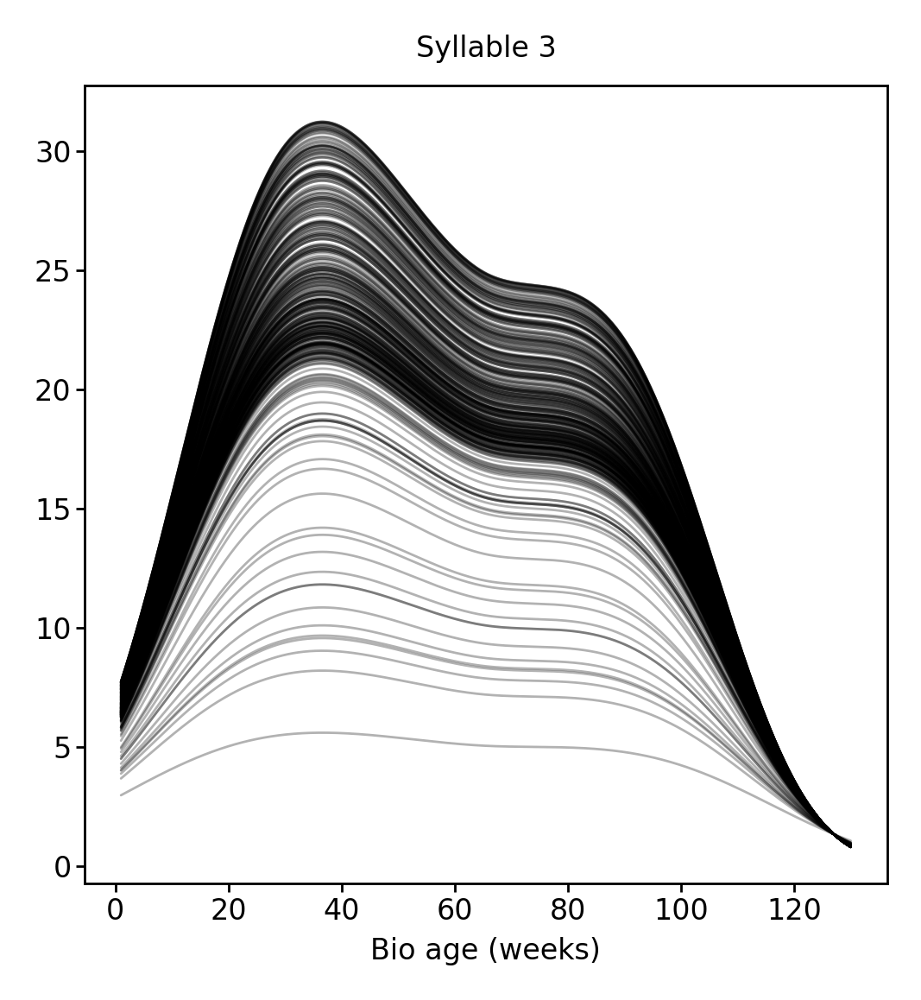

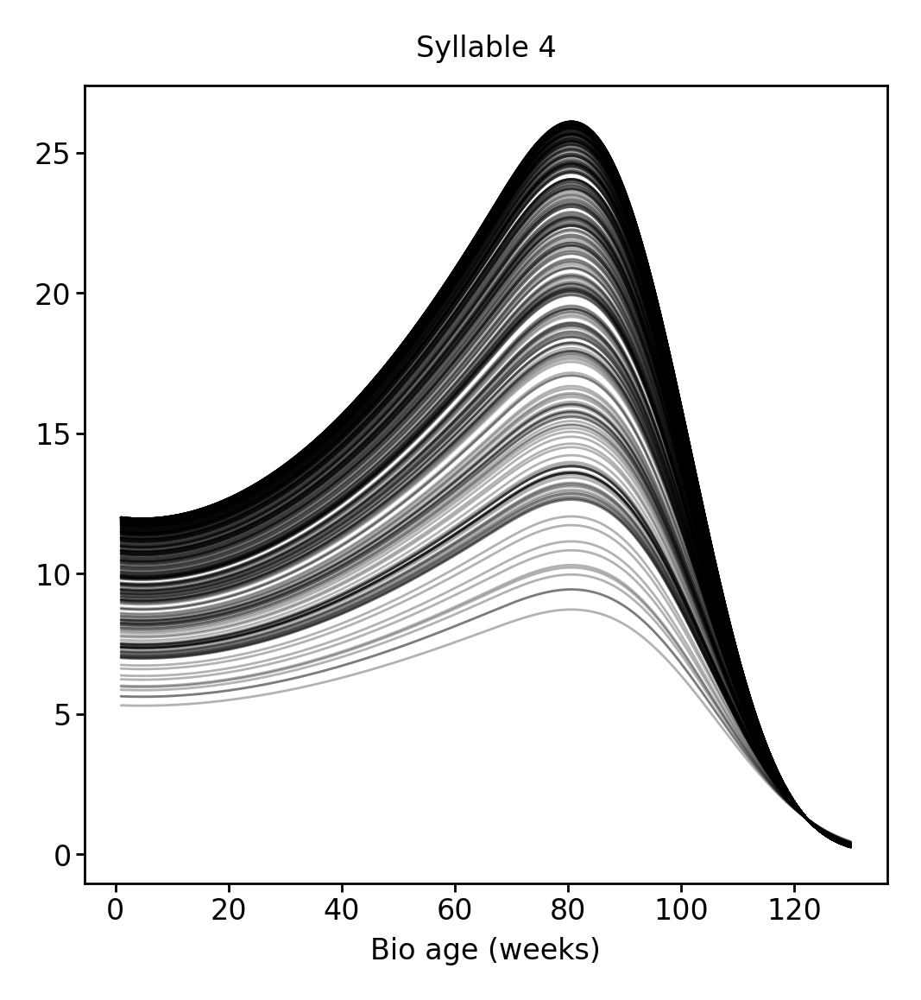

...

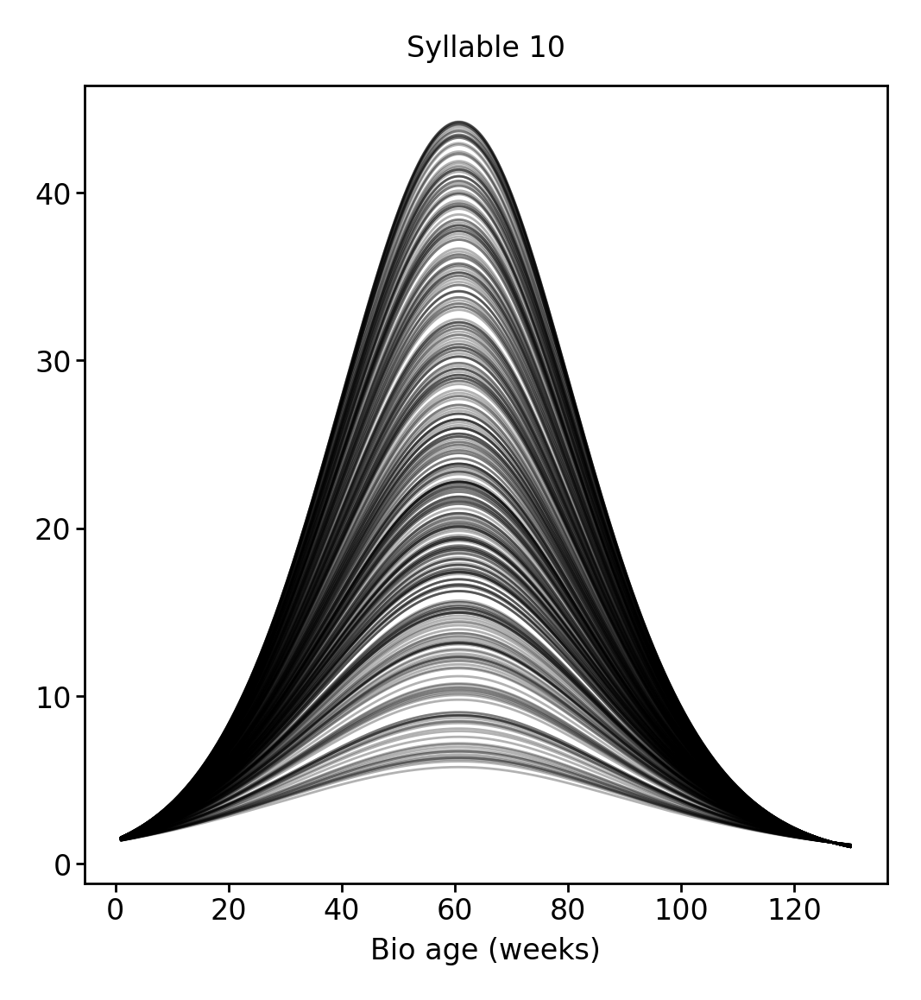

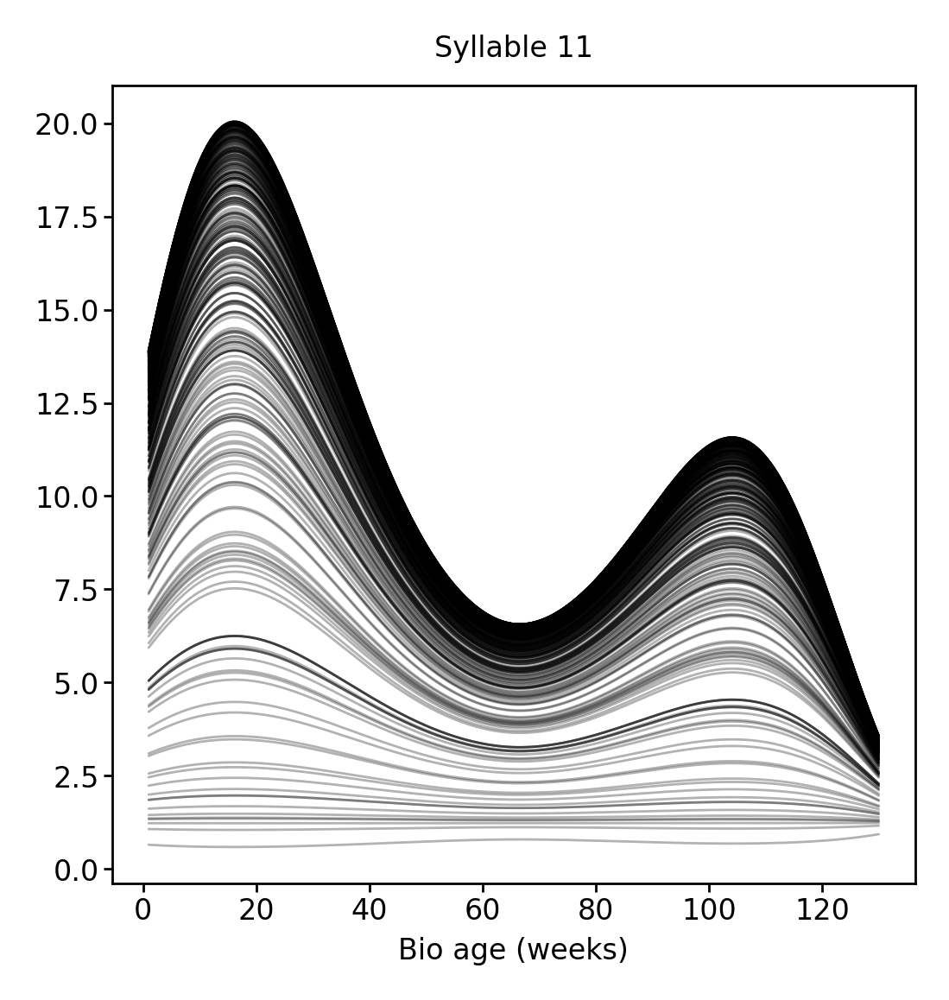

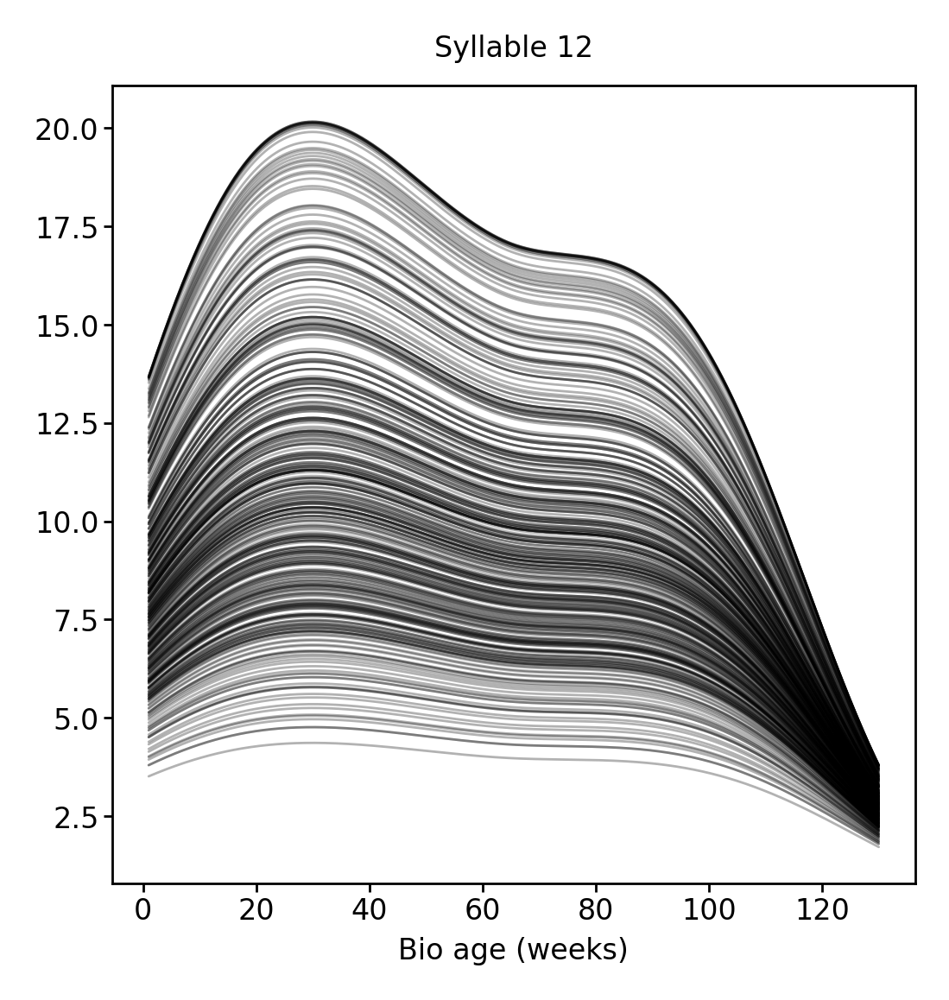

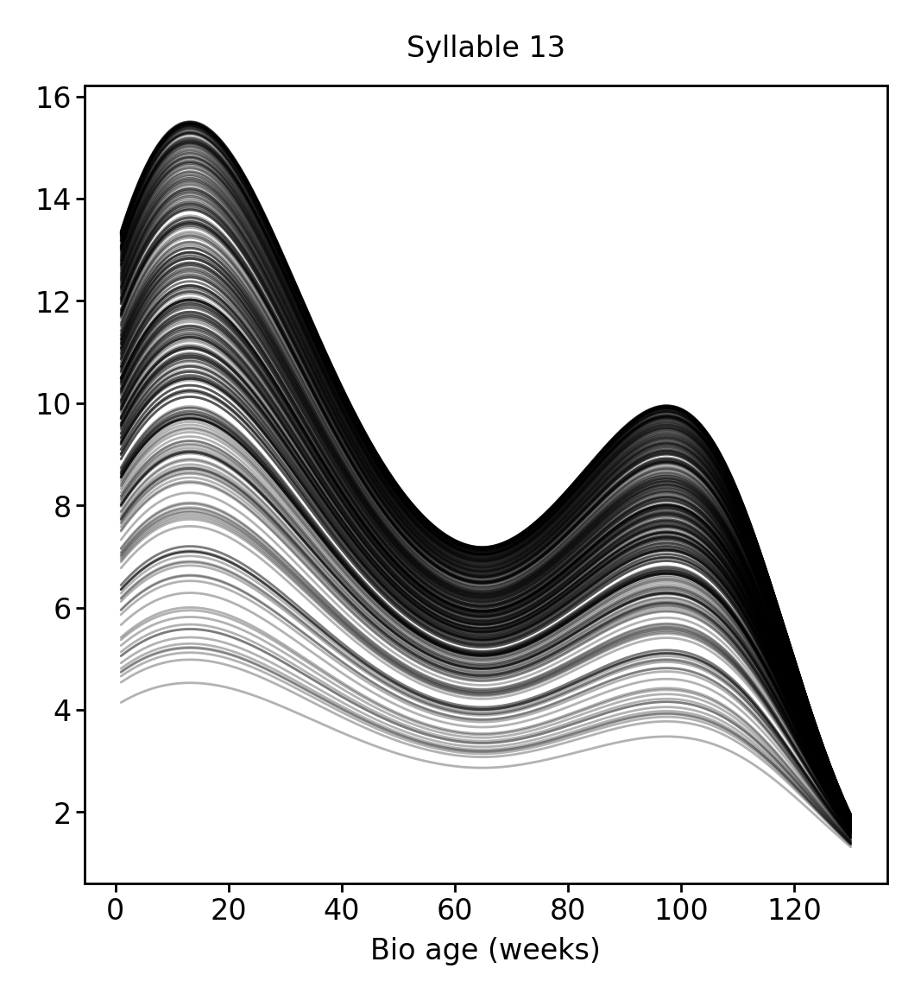

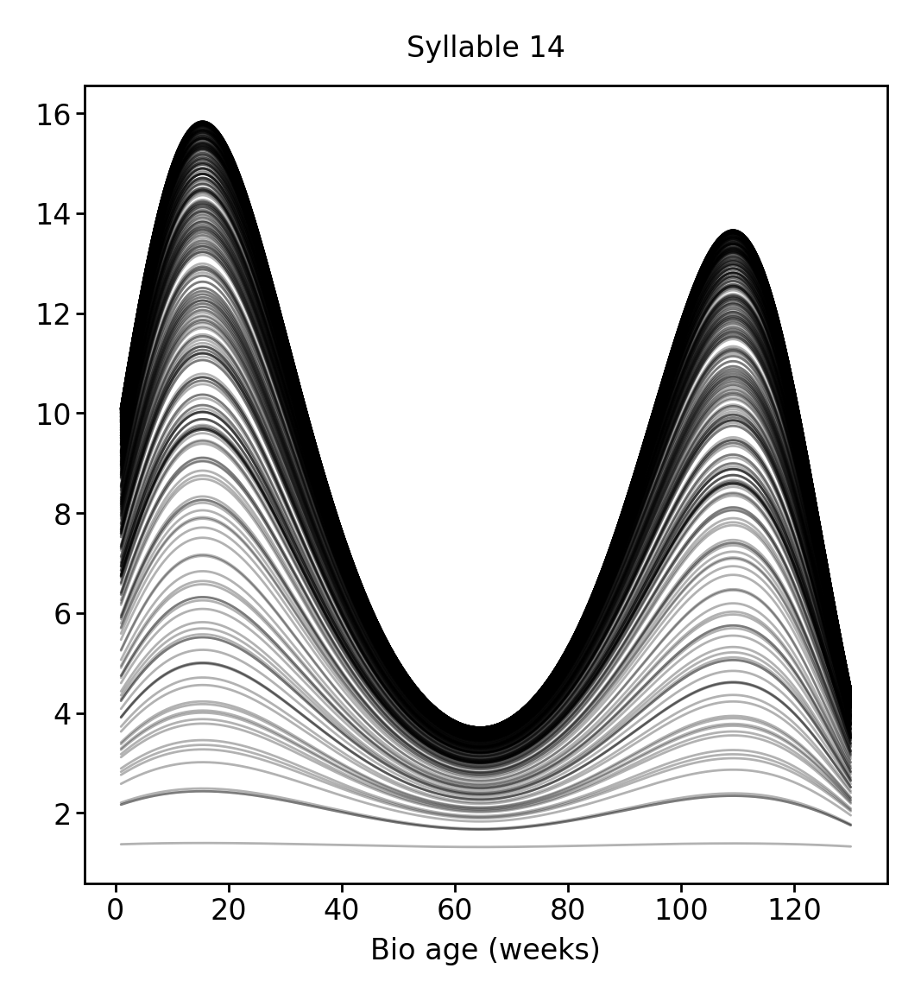

In [16]:
for syllable in range(15):
    plt.figure()
    for i in range(len(out[0]['concentrations'])):
        plt.plot(np.linspace(1, 130, 1000), out[0]['concentrations'][i, :, syllable], lw=0.5, c='k', alpha=0.3)
    plt.xlabel("Bio age (weeks)")
    plt.title(f"Syllable {syllable}")

# Longtogeny

In [28]:
df = pd.read_parquet(
    # "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_relabeled_counts_matrix_v00.parquet"
    "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_relabeled_counts_matrix_v00.parquet"
)
df = df.sort_index(axis=1)
mask = df.index.get_level_values("age") < 100
df = df[mask].copy()

n_syllables = 70
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))[:, :n_syllables]

size_df = pd.read_parquet(
    # '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_mouse_area_df_v00.parquet'
    '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_mouse_area_df_v00.parquet'
)

sizes_col = size_df.groupby('age')['quant_0.5'].transform(demean)
sizes_col = sizes_col.loc[df.index]

sizes_col.loc[sizes_col == 0] = np.nan
sizes_col = sizes_col.groupby('mouse').apply(lambda df: df.sort_index(level='age').interpolate()).droplevel(0)

sizes_col = sizes_col.loc[df.index]

label_encoder = OneHotEncoder(sparse_output=False, dtype=np.float32)
mouse_ids = label_encoder.fit_transform(
    sizes_col.index.get_level_values("mouse").to_numpy()[:, None]
).T

In [29]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": 10,  # weeks
    "bio_params_sd": 0.3,
    "size_params_sd": 0.3,
    "n_age_samples": 1000,
    "n_splines": 5,
    "n_size_splines": 5,
    "n_development_splines": 9,
    "n_syllables": n_syllables,
    "n_keep_sylls": 13,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 150,
}